In [1]:
# --- Init ---
from pathlib import Path
import numpy as np
import matplotlib.pyplot as plt

# наши модули
from hybrid.io.tif import read_tiff_memmap, write_tiff_stack  # ридер
from hybrid.cli.mc_cli import run_mc        # батч-PWrigid API из CLI (реэкспорт в __init__ тоже ок)
from hybrid.summary.qc_maps import correlation_image, pnr_image
from hybrid.filters.flatfield import estimate_flatfield, apply_flatfield  # :contentReference[oaicite:0]{index=0}

# === пути (относительно папки ноутбука D:\Projects\hybrid\notebooks) ===
DATA_DIR = Path("data/shorts")
BASENAME = "MoS1b_s3_C1_M3_T3_TRE_2025_04_08_clip_000825-001125"

# вход: .tif или .tiff (попробуем оба варианта)
in_path = None
for ext in (".tiff", ".tif"):
    p = (DATA_DIR / f"{BASENAME}{ext}")
    if p.exists():
        in_path = p
        break
assert in_path is not None, "Файл не найден ни с .tiff, ни с .tif"

# целевая папка (без clip-сегмента)
root_name = BASENAME.split("_clip_")[0]
OUT_DIR = DATA_DIR / root_name
OUT_DIR_QC = OUT_DIR / "_qc_mc"
OUT_DIR.mkdir(parents=True, exist_ok=True)
OUT_DIR_QC.mkdir(parents=True, exist_ok=True)

print("Input:", in_path)
print("Out dir:", OUT_DIR)


Input: data\shorts\MoS1b_s3_C1_M3_T3_TRE_2025_04_08_clip_000825-001125.tiff
Out dir: data\shorts\MoS1b_s3_C1_M3_T3_TRE_2025_04_08


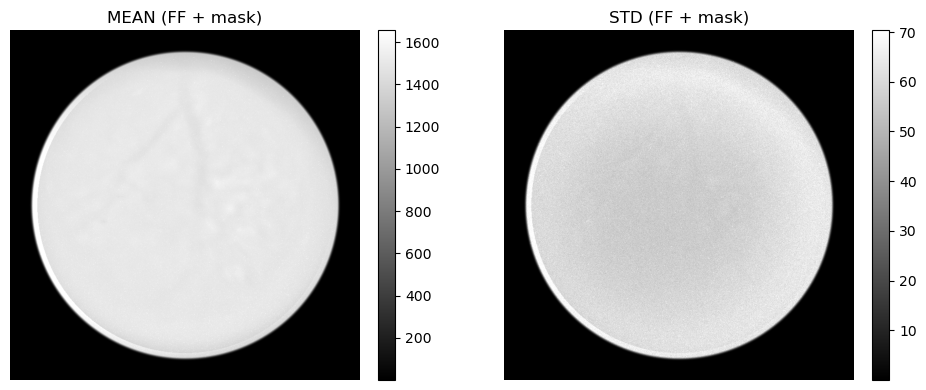

In [2]:
# --- LOAD (FF output) + SOFT MASK (r=0.9) exactly like CROP+MASK ---

from pathlib import Path
import numpy as np
import tifffile as tiff

def make_soft_disk_mask(h, w, r_frac=0.90, edge=12.0):
    cy = h // 2
    cx = w // 2
    yy, xx = np.ogrid[:h, :w]
    dist = np.sqrt((yy - cy)**2 + (xx - cx)**2)
    r = int(r_frac * (h // 2))              # <-- 0.90 как в старом коде
    mask = np.ones((h, w), np.float32)
    mask[dist > r] = 0.0
    ring = (dist > r - edge) & (dist <= r)
    # мягкий косинусный край — тот же, что был ранее
    mask[ring] = 0.5 * (1.0 + np.cos(np.pi * (dist[ring] - (r - edge)) / edge))
    return mask

# 1) читаем стек после FF
in_path = Path("data/shorts/MoS1b_s3_C1_M3_T3_TRE_2025_04_08/MoS1b_s3_C1_M3_T3_TRE_2025_04_08_clip_000825-001125_crop768_masked_flatfield_reg.tiff")
arr = tiff.imread(in_path.as_posix())
movie = arr.astype(np.float32)
if movie.ndim == 3 and movie.shape[0] in (768, 800):  # (H,W,T) -> (T,H,W)
    movie = np.transpose(movie, (2,0,1)).astype(np.float32)

T, H, W = movie.shape
mask = make_soft_disk_mask(H, W, r_frac=0.90, edge=12.0)

# 2) применяем маску (как раньше)
movie_masked = movie * mask[None, ...]

# (опционально) быстрые шкалы, чтобы визуализация совпадала с «красивой»
mean_map = movie_masked.mean(axis=0)
std_map  = movie_masked.std(axis=0, ddof=1)

vmean = (float(np.percentile(mean_map[mask>0], 1)),
         float(np.percentile(mean_map[mask>0], 99)))
vstd  = (float(np.percentile(std_map[mask>0],  1)),
         float(np.percentile(std_map[mask>0],  99)))

import matplotlib.pyplot as plt
fig, ax = plt.subplots(1,2, figsize=(10,4))
im0 = ax[0].imshow(mean_map, cmap="gray", vmin=vmean[0], vmax=vmean[1]); ax[0].set_title("MEAN (FF + mask)"); ax[0].axis("off"); fig.colorbar(im0, ax=ax[0], fraction=0.046, pad=0.04)
im1 = ax[1].imshow(std_map,  cmap="gray", vmin=vstd[0],  vmax=vstd[1]);  ax[1].set_title("STD (FF + mask)");  ax[1].axis("off"); fig.colorbar(im1, ax=ax[1], fraction=0.046, pad=0.04)
plt.tight_layout(); plt.show()


In [3]:
# === Viz utils: перцентильные шкалы внутри маски (как в FF-QC) ===
import numpy as np
import matplotlib.pyplot as plt

def _mask_core(mask, core_thresh=0.99):
    """Возвращает булеву маску ядра (core), где маска почти 1."""
    if mask is None:
        return None
    m = np.asarray(mask, dtype=np.float32)
    return (m > core_thresh)

def robust_limits_masked(img, mask=None, p=(1, 99), core_thresh=0.99):
    """
    Перцентильные лимиты vmin/vmax, как в FF-QC:
    считаем только по пикселям внутри 'ядра' маски.
    """
    img = np.asarray(img)
    if mask is None:
        x = img.ravel()
    else:
        core = _mask_core(mask, core_thresh)
        x = img[core].ravel()
    # защищаемся от NaN/Inf и вырожденности
    x = x[np.isfinite(x)]
    if x.size == 0:
        return float(np.nanmin(img)), float(np.nanmax(img))
    lo, hi = np.nanpercentile(x, p)
    if not np.isfinite(lo) or not np.isfinite(hi) or hi <= lo:
        lo, hi = float(np.nanmin(x)), float(np.nanmax(x) + 1.0)
        if hi <= lo:
            hi = lo + 1.0
    return float(lo), float(hi)

def imshow_masked(ax, img, mask=None, p=(1, 99), core_thresh=0.99, title=None, cmap='gray', add_cbar=False):
    """
    Отрисовка с лимитами по robust_limits_masked. Возвращает (vmin, vmax, im).
    """
    vmin, vmax = robust_limits_masked(img, mask, p=p, core_thresh=core_thresh)
    im = ax.imshow(img, cmap=cmap, vmin=vmin, vmax=vmax)
    ax.set_axis_off()
    if title:
        ax.set_title(title)
    if add_cbar:
        plt.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
    return vmin, vmax, im

def qc_grid_mean_std_corr_pnr(mean_map, std_map, corr_map, pnr_map, mask,
                              p_mean=(1,99), p_std=(1,99), p_corr=(5,95), p_pnr=(5,99),
                              core_thresh=0.99, figsize=(11,9), suptitle=None):
    """
    Сетка из 4 карт с лимитами как в «хорошем» FF-QC.
    """
    fig, axs = plt.subplots(2, 2, figsize=figsize)

    imshow_masked(axs[0,0], mean_map, mask, p=p_mean, core_thresh=core_thresh,
                  title="MEAN", add_cbar=True)
    imshow_masked(axs[0,1], std_map,  mask, p=p_std,  core_thresh=core_thresh,
                  title="STD",  add_cbar=True)
    imshow_masked(axs[1,0], corr_map, mask, p=p_corr, core_thresh=core_thresh,
                  title="Correlation", add_cbar=True)
    imshow_masked(axs[1,1], pnr_map,  mask, p=p_pnr,  core_thresh=core_thresh,
                  title="PNR", add_cbar=True)

    if suptitle:
        plt.suptitle(suptitle, y=0.99)
    plt.tight_layout()
    return fig, axs

def summarize_qc_stats(mean_map, std_map, corr_map, pnr_map, mask, core_thresh=0.99):
    """
    Возвращает те же агрегаты, что ты писал в FF-QC: <mean>, <STD>, <CV>, median(corr), median(PNR).
    """
    core = _mask_core(mask, core_thresh)
    m = np.asarray(mean_map)[core]
    s = np.asarray(std_map)[core]
    c = np.asarray(corr_map)[core]
    p = np.asarray(pnr_map)[core]

    gm = float(np.nanmean(m))
    gs = float(np.nanmean(s))
    cv = float(np.nanmean(s / (m + 1e-9)))
    corr_med = float(np.nanmedian(c))
    pnr_med  = float(np.nanmedian(p))
    return gm, gs, cv, corr_med, pnr_med


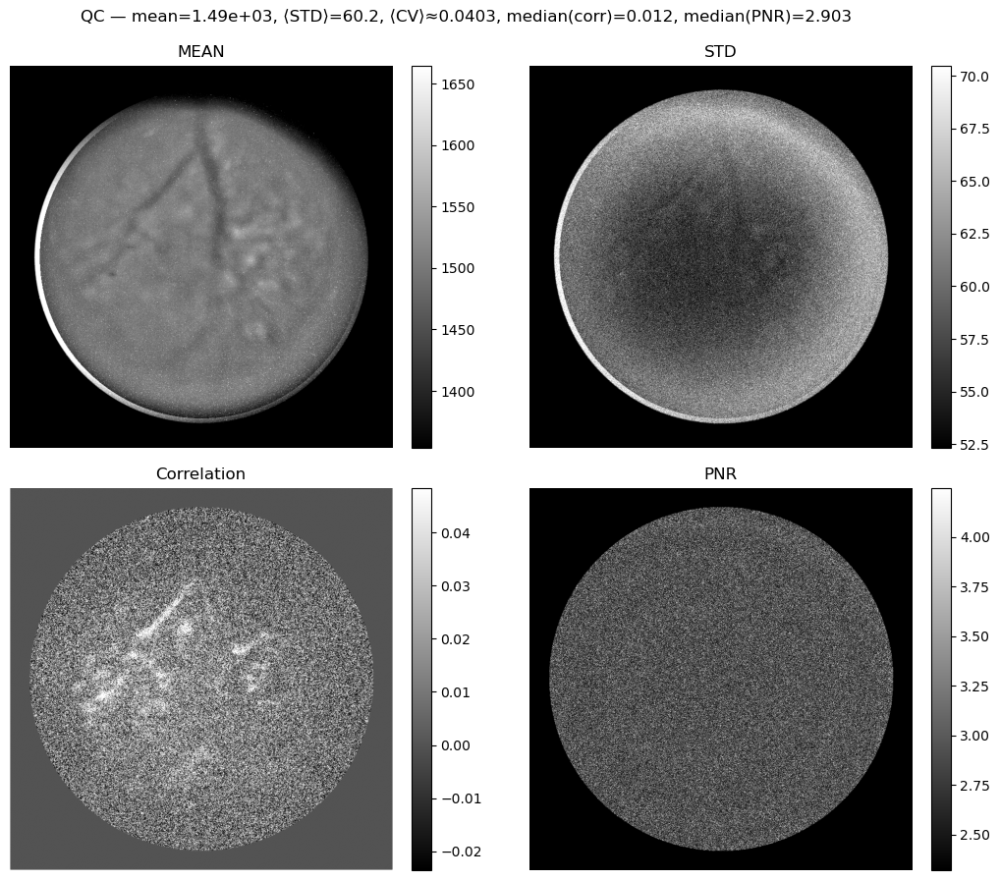

In [4]:
# === Проверка утилит на текущем стеке movie + mask ===
import numpy as np

# 1) карты
mean_map = movie.mean(axis=0).astype(np.float32)
std_map  = movie.std(axis=0, ddof=1).astype(np.float32)

# Если импортированы твои qc_maps:
#   from hybrid.summary.qc_maps import correlation_image, pnr_image
corr_map = correlation_image(movie, time_axis=0).astype(np.float32)
pnr_map  = pnr_image(movie, time_axis=0, hp_window=7).astype(np.float32)

# 2) сводные метрики «как в FF-QC»
gm, gs, cv, corr_med, pnr_med = summarize_qc_stats(mean_map, std_map, corr_map, pnr_map, mask, core_thresh=0.99)
title = f"QC — mean={gm:.3g}, ⟨STD⟩={gs:.3g}, ⟨CV⟩≈{cv:.3g}, median(corr)={corr_med:.3f}, median(PNR)={pnr_med:.3f}"

# 3) визуализация с перцентилями внутри ядра маски
_ = qc_grid_mean_std_corr_pnr(
    mean_map, std_map, corr_map, pnr_map, mask,
    p_mean=(1,99), p_std=(1,99), p_corr=(5,95), p_pnr=(5,99),
    core_thresh=0.99, figsize=(11,9), suptitle=title
)
plt.show()


In [10]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
from scipy.ndimage import gaussian_filter, sobel, uniform_filter, distance_transform_edt
from skimage.feature import corner_shi_tomasi, peak_local_max

# --- utility: min–max нормализация с безопасным делением ---
def _norm01(x):
    x = x.astype(np.float32)
    mn, mx = np.percentile(x, 1), np.percentile(x, 99)  # робастно
    return np.clip((x - mn) / (mx - mn + 1e-6), 0, 1)

def build_info_map(frame, sigma_smooth=1.0, std_win=11,
                   w_grad=0.4, w_corner=0.4, w_std=0.2):
    """Собираем карту информативности S из градиента, углов и локальной STD."""
    f = gaussian_filter(frame.astype(np.float32), sigma_smooth)

    # модуль градиента
    gy = sobel(f, axis=0); gx = sobel(f, axis=1)
    grad = np.hypot(gx, gy)

    # угловатость Shi–Tomasi
    corner = corner_shi_tomasi(f)

    # локальная дисперсия (STD через mean и mean of squares)
    mu  = uniform_filter(f, std_win)
    mu2 = uniform_filter(f**2, std_win)
    std = np.sqrt(np.maximum(mu2 - mu**2, 0))

    # нормируем и смешиваем
    G = _norm01(grad); C = _norm01(corner); V = _norm01(std)
    S = w_grad*G + w_corner*C + w_std*V
    return S, {'grad':G, 'corner':C, 'std':V}

def select_rois(frame_ref, mask, K=10, hw=32, search=6, margin=12,
                sigma_smooth=1.0, std_win=11,
                w_grad=0.4, w_corner=0.4, w_std=0.2,
                min_distance_factor=2.0):
    """
    Возвращает centers [(y,x), ...], карту S и валидную область.
    - mask: 1 внутри диска, 0 снаружи (может быть мягкой – возьмём >0.5)
    - ROI-центры не ближе чем (hw+search+margin) к маске и друг к другу.
    """
    H, W = frame_ref.shape
    # информативность
    S, parts = build_info_map(frame_ref, sigma_smooth, std_win, w_grad, w_corner, w_std)

    # валидная внутренняя область (дистанция до края маски)
    core_bin = (mask > 0.5).astype(np.uint8)
    dist = distance_transform_edt(core_bin)
    safety = hw + search + margin
    valid_core = (dist >= safety)

    # обнулим S вне core
    Sc = S * valid_core

    # неперекрывающиеся пики (NMS)
    min_dist = int(min_distance_factor * hw)   # ~ 2*hw
    peaks = peak_local_max(Sc, min_distance=min_dist, num_peaks=K,
                           exclude_border=False, labels=valid_core)

    centers = [(int(y), int(x)) for y, x in peaks]  # (row,col)
    return centers, S, valid_core, parts


In [11]:
# --- ROI visualization (uses existing imshow_masked) ---

import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle

def plot_rois_on_frames(A, B, centers, hw=32, scores=None,
                        titleA='Frame A', titleB='Frame B',
                        mask=None, p=(1,99), number_color='w', core_thresh=0.99):
    """
    Рисуем нумерованные ROI на двух кадрах. Отрисовка через imshow_masked().
    """
    import matplotlib.cm as cm
    cmap = plt.get_cmap('viridis')

    fig, axes = plt.subplots(1, 2, figsize=(12, 6))
    imshow_masked(axes[0], A, mask=mask, p=p, core_thresh=core_thresh, title=titleA)
    imshow_masked(axes[1], B, mask=mask, p=p, core_thresh=core_thresh, title=titleB)

    if scores is None:
        vmin, vmax = 0.0, 1.0
    else:
        vmin, vmax = float(np.nanmin(scores)), float(np.nanmax(scores) + 1e-6)

    for idx, (cy, cx) in enumerate(centers):
        color = cmap(0.70) if scores is None else cmap((scores[idx]-vmin)/(vmax-vmin+1e-6))
        for ax in axes:
            ax.add_patch(Rectangle((cx - hw, cy - hw), 2*hw + 1, 2*hw + 1,
                                   fill=False, lw=1.8, color=color))
            ax.text(cx - hw + 3, cy - hw + 12, f"{idx}",
                    color=number_color, fontsize=9, weight='bold',
                    ha='left', va='center',
                    bbox=dict(facecolor='black', alpha=0.35, edgecolor='none', pad=1.5))
    plt.tight_layout(); plt.show()

def plot_roi_crops(A, B, centers, hw=32, cols=5,
                   suptitle='ROI crops (A top | B bottom)', p=(1,99), core_thresh=0.99):
    """
    Показываем вырезки ROI: верх — кадр A, низ — кадр B. Отрисовка через imshow_masked().
    """
    K = len(centers)
    cols = max(1, cols)
    pages = int(np.ceil(K / cols))
    for page in range(pages):
        idx = slice(page*cols, min((page+1)*cols, K))
        cs = centers[idx]
        fig, axes = plt.subplots(2, len(cs), figsize=(3.2*len(cs), 6))
        if len(cs) == 1:
            axes = np.array([[axes[0]], [axes[1]]])  # унификация

        for j, (cy, cx) in enumerate(cs):
            a = A[cy-hw:cy+hw+1, cx-hw:cx+hw+1]
            b = B[cy-hw:cy+hw+1, cx-hw:cx+hw+1]
            imshow_masked(axes[0, j], a, mask=None, p=p, core_thresh=core_thresh)
            axes[0, j].set_title(f"ROI#{page*cols + j}")
            imshow_masked(axes[1, j], b, mask=None, p=p, core_thresh=core_thresh)
        fig.suptitle(suptitle); plt.tight_layout(); plt.show()


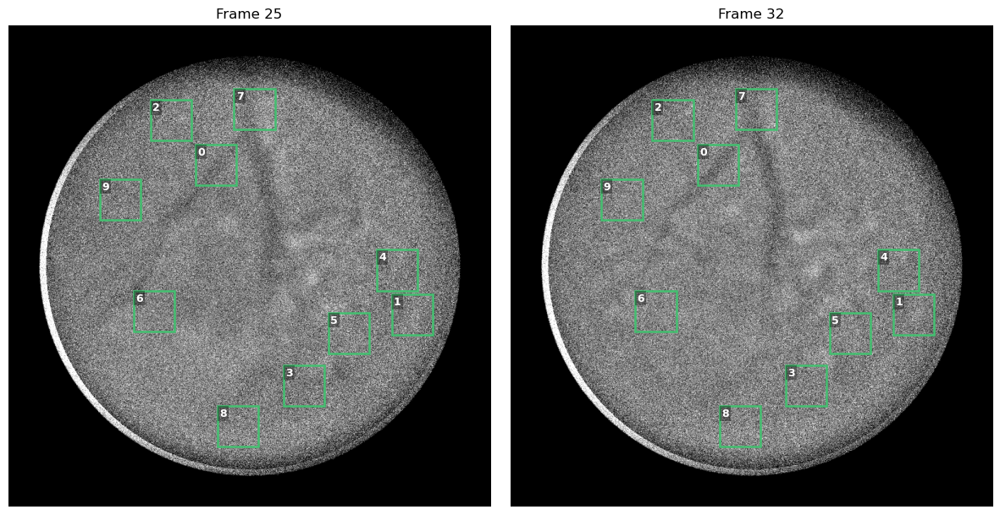

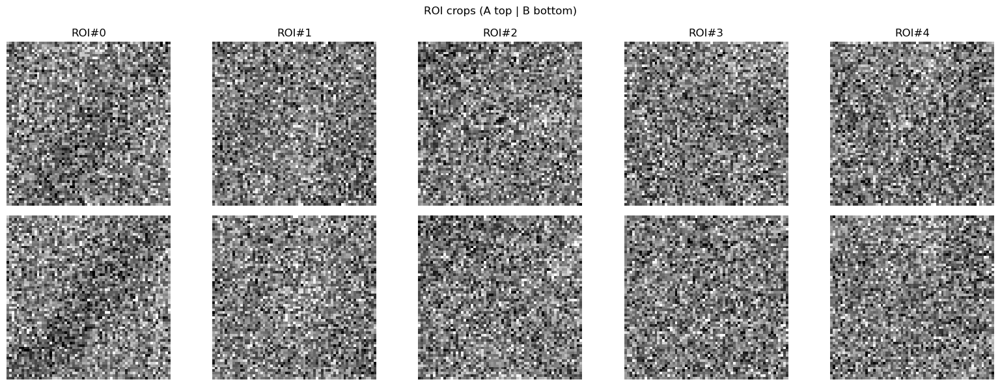

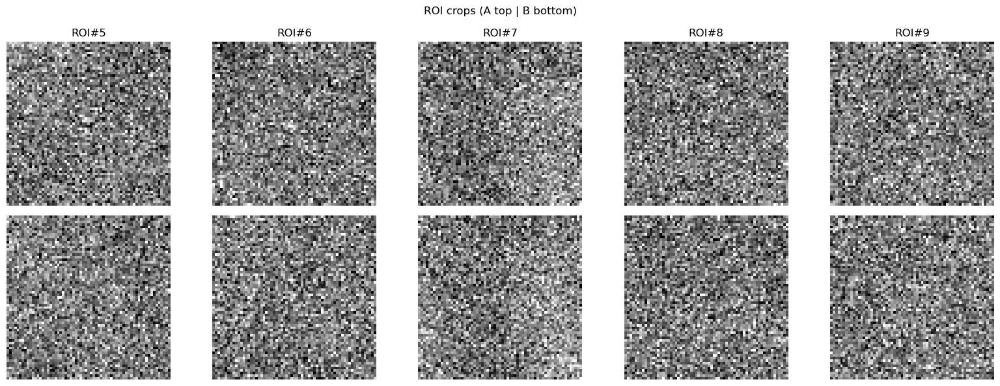

In [12]:
A = movie[25]; B = movie[32]
centers, S, valid_core, parts = select_rois(A, mask, K=10, hw=32, search=6, margin=12)

plot_rois_on_frames(A, B, centers, hw=32, titleA="Frame 25", titleB="Frame 32",
                    mask=mask, p=(1,99), number_color='w')

plot_roi_crops(A, B, centers, hw=32, cols=5, suptitle="ROI crops (A top | B bottom)",
               p=(1,99))


In [16]:
import numpy as np
from scipy.ndimage import gaussian_filter, shift as imshift, rotate as imrotate

# ----- базовые утилиты -----
def ncc(a, b):
    a = a - a.mean(); b = b - b.mean()
    den = (a.std()+1e-6) * (b.std()+1e-6)
    return float((a*b).sum() / den)

def cos_window(h, w):
    """2D косиновое окно (аподизация), снижает влияние краёв при повороте."""
    wy = 0.5 - 0.5 * np.cos(2*np.pi*np.arange(h)/(h-1))
    wx = 0.5 - 0.5 * np.cos(2*np.pi*np.arange(w)/(w-1))
    return np.outer(wy, wx).astype(np.float32)

def subparabola(m1, m0, p1):
    """Параболическая подстройка вершины по трём точкам (-1,0,+1). Возвращает смещение вершины в шагах."""
    denom = (m1 - 2*m0 + p1) + 1e-12
    return 0.5 * (m1 - p1) / denom

# ----- твой этап: translation -----
def estimate_shift_roi(A, B, cy, cx, hw=32, search=12, pre_smooth=0.0):
    """Возвращает (dy, dx, peak) B->A в пикселях (dy<0 вверх, dx>0 вправо)."""
    A = A.astype(np.float32); B = B.astype(np.float32)
    if pre_smooth > 0:
        A = gaussian_filter(A, pre_smooth); B = gaussian_filter(B, pre_smooth)

    Aroi = A[cy-hw:cy+hw+1, cx-hw:cx+hw+1]
    best = (-1e9, 0, 0)
    for dy in range(-search, search+1):
        for dx in range(-search, search+1):
            Broi = B[cy-hw+dy:cy+hw+1+dy, cx-hw+dx:cx+hw+1+dx]
            if Broi.shape != Aroi.shape:
                continue
            s = ncc(Aroi, Broi)
            if s > best[0]:
                best = (s, dy, dx)
    peak, iy, ix = best

    # субпиксель по y
    s_m1 = ncc(Aroi, B[cy-hw+iy-1:cy+hw+1+iy-1, cx-hw+ix:cx+hw+1+ix]) if abs(iy-1) <= search else peak
    s_p1 = ncc(Aroi, B[cy-hw+iy+1:cy+hw+1+iy+1, cx-hw+ix:cx+hw+1+ix]) if abs(iy+1) <= search else peak
    dy_sub = iy + subparabola(s_m1, peak, s_p1)

    # субпиксель по x
    s_m1 = ncc(Aroi, B[cy-hw+iy:cy+hw+1+iy, cx-hw+ix-1:cx+hw+1+ix-1]) if abs(ix-1) <= search else peak
    s_p1 = ncc(Aroi, B[cy-hw+iy:cy+hw+1+iy, cx-hw+ix+1:cx+hw+1+ix+1]) if abs(ix+1) <= search else peak
    dx_sub = ix + subparabola(s_m1, peak, s_p1)

    return float(dy_sub), float(dx_sub), float(peak)

# ----- новый этап: малый поворот вокруг центра ROI -----
def estimate_rotation_roi(A, B, cy, cx, dy, dx, hw=32, theta_max=5.0, theta_step=0.5, pre_smooth=0.0, use_window=True):
    """
    Ищем угол поворота (в градусах) кадра B относительно A внутри ROI.
    A, B — исходные кадры; (cy, cx) — центр ROI в A; (dy, dx) — уже найденный сдвиг B->A.
    Сначала сдвигаем B на (dy,dx), затем перебираем углы в диапазоне [-theta_max, +theta_max].
    """
    A = A.astype(np.float32); B = B.astype(np.float32)
    if pre_smooth > 0:
        A = gaussian_filter(A, pre_smooth); B = gaussian_filter(B, pre_smooth)

    # вырезаем ROI из A
    Aroi = A[cy-hw:cy+hw+1, cx-hw:cx+hw+1]
    # сдвигаем весь B, затем берём тот же ROI-окно
    Bshift = imshift(B, shift=(-dy, -dx), order=1, mode='nearest', prefilter=False)
    Broi = Bshift[cy-hw:cy+hw+1, cx-hw:cx+hw+1]

    # аподизация краёв (уменьшает артефакты при повороте)
    if use_window:
        w = cos_window(*Aroi.shape)
        Aroi_w = Aroi * w
    else:
        w = 1.0
        Aroi_w = Aroi

    # грубый поиск по углам
    thetas = np.arange(-theta_max, theta_max + 1e-6, theta_step, dtype=np.float32)
    scores = []
    best = (-1e9, 0.0)
    for th in thetas:
        R = imrotate(Broi, angle=th, reshape=False, order=1, mode='nearest', prefilter=False)
        s = ncc(Aroi_w, (R * w) if use_window else R)
        scores.append(s)
        if s > best[0]:
            best = (s, th)
    peak_rot, th0 = best

    # суб-градусная подстройка параболой по соседним отсчётам
    i0 = int(round((th0 - thetas[0]) / theta_step))
    if 0 < i0 < len(thetas)-1:
        m1, m0, p1 = scores[i0-1], scores[i0], scores[i0+1]
        delta = subparabola(m1, m0, p1) * theta_step
        th_sub = th0 + float(delta)
    else:
        th_sub = th0

    return float(th_sub), float(peak_rot)

# ----- объединяющая обёртка -----
def estimate_shift_rot_roi(A, B, cy, cx, hw=32,
                           search=12, pre_smooth=0.0,
                           theta_max=5.0, theta_step=0.5, use_window=True):
    """
    Возвращает: dy, dx (пикс), theta_deg (градусы), score_trans, score_rot.
    """
    dy, dx, peak_t = estimate_shift_roi(A, B, cy, cx, hw=hw, search=search, pre_smooth=pre_smooth)
    theta_deg, peak_r = estimate_rotation_roi(A, B, cy, cx, dy, dx, hw=hw,
                                              theta_max=theta_max, theta_step=theta_step,
                                              pre_smooth=pre_smooth, use_window=use_window)
    return dy, dx, theta_deg, peak_t, peak_r


In [17]:
def roi_quality(A, B, centers, hw=32, search=6):
    rows = []
    for (cy, cx) in centers:
        dy, dx, theta_deg, s_t, s_r = estimate_shift_rot_roi(
            A, B, cy=cy, cx=cx, hw=hw, search=search,
            pre_smooth=1.0, theta_max=5.0, theta_step=0.5, use_window=True
        )
        score = max(s_t, s_r)
        rows.append((cy, cx, dy, dx, theta_deg, s_t, s_r, score))
    return np.array(rows, dtype=np.float32)

In [14]:
# пример: один ROI в (cy,cx) = (192,383)
dy, dx, theta_deg, s_t, s_r = estimate_shift_rot_roi(movie[25], movie[32],
                                                     cy=192, cx=383,
                                                     hw=32, search=12,
                                                     pre_smooth=1.0,
                                                     theta_max=5.0, theta_step=0.5)
print(f"dy={dy:.2f}, dx={dx:.2f}, θ={theta_deg:.2f}° | trans={s_t:.3f}, rot={s_r:.3f}")


dy=-10.13, dx=4.43, θ=2.62° | trans=2432.938, rot=4224.072


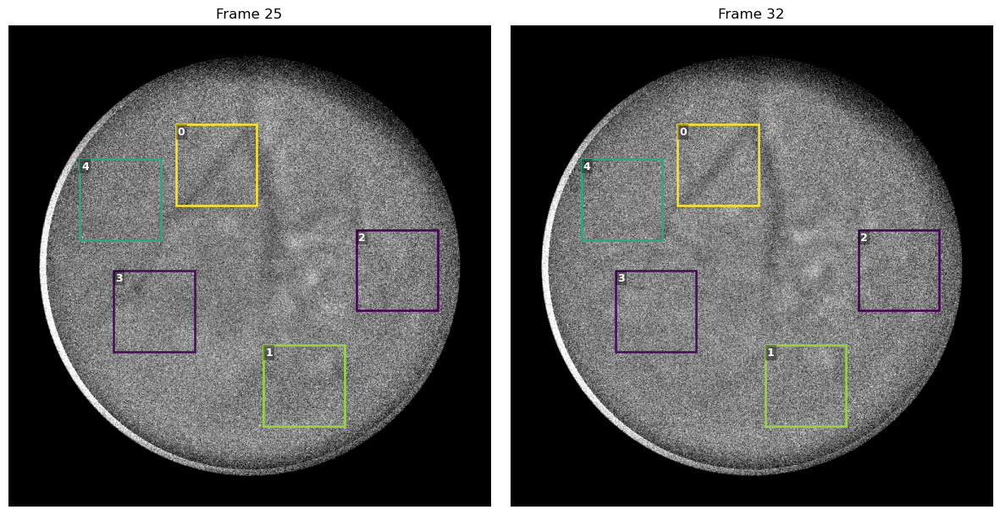

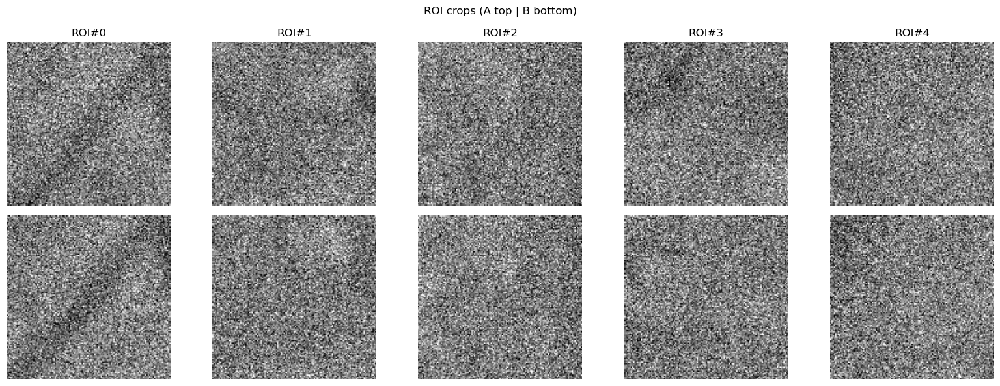

,roi_id,cy,cx,dy,dx,theta_deg,score_trans,score_rot,score
0,0,222.0,330.0,-10.572,4.113,-1.203,5862.815918,16637.662109,16637.662109
1,1,574.0,470.0,-0.374,0.172,1.464,4321.133789,16637.603516,16637.603516
2,2,390.0,618.0,-10.105,-0.297,-1.472,4642.826172,16637.285156,16637.285156
3,3,455.0,231.0,-8.254,-9.055,-3.917,1105.375977,16637.294922,16637.294922
4,4,277.0,177.0,-11.175,2.531,-1.679,3306.548096,16637.515625,16637.515625


Median dy = -10.105,  dx = 0.172,  theta = -1.472°   (over 5 ROIs)


In [36]:
# === Analysis: frames 25 vs 32 — pick ROIs, estimate translation+rotation, visualize, tabulate ===
import numpy as np
import pandas as pd

# 1) кадры
tA, tB = 25, 32
A = movie[tA].astype("float32")
B = movie[tB].astype("float32")

# 2) выбираем ROI на референсном кадре A
K = 10
hw = 64
search = 12
margin = 12
centers, S, valid_core, parts = select_rois(
    A, mask, K=K, hw=hw, search=search, margin=margin,
    sigma_smooth=1.0, std_win=11,
    w_grad=0.4, w_corner=0.4, w_std=0.2,
    min_distance_factor=2.0
)

# 3) считаем для каждого ROI: dy, dx, θ, а также score_trans / score_rot
rows = roi_quality(A, B, centers, hw=hw, search=search)

# 4) визуализация — используем уже объявленные хелперы (с робастной шкалой)
plot_rois_on_frames(A, B, centers, hw=hw, scores=rows[:, -1],
                    titleA=f"Frame {tA}", titleB=f"Frame {tB}", mask=mask)
plot_roi_crops(A, B, centers, hw=hw, cols=5,
               suptitle="ROI crops (A top | B bottom)")

# 5) таблица результатов
cols = ["cy", "cx", "dy", "dx", "theta_deg", "score_trans", "score_rot", "score"]
df = pd.DataFrame(rows, columns=cols)
df.insert(0, "roi_id", np.arange(len(df)))   # удобный индекс ROI
display(df.round({"dy":3, "dx":3, "theta_deg":3, "score_trans":3, "score_rot":3, "score":3}))

# краткая сводка по медианам
print(f"Median dy = {np.median(df['dy']):.3f},  "
      f"dx = {np.median(df['dx']):.3f},  "
      f"theta = {np.median(df['theta_deg']):.3f}°   (over {len(df)} ROIs)")


In [37]:
from scipy.ndimage import gaussian_filter, sobel, uniform_filter, distance_transform_edt
from skimage.feature import peak_local_max
import numpy as np

def select_rois_v2(frame_ref, mask, K=10, hw=32, search=6, margin=12,
                   sigma_smooth=1.0, std_win=11,
                   w_grad=0.3, w_corner=0.4, w_std=0.3,
                   hp_sigma_lo=1.0, hp_sigma_hi=8.0,
                   rim_band=48,                    # ширина «штрафного» кольца у края
                   min_distance_factor=2.0,
                   oversample=5):                  # во сколько раз больше кандидатов собрать
    """
    Улучшенный выбор ROI:
      • DoG-high-pass перед оценкой признаков (гасим виньетку/фон),
      • плавный штраф у края,
      • oversample + greedy farthest-point для равномерного покрытия.
    """
    H, W = frame_ref.shape
    core_bin = (mask > 0.5).astype(np.uint8)
    dist = distance_transform_edt(core_bin)

    # — безопасная внутренняя область (чтобы ROI целиком входил)
    safety = int(hw + search + margin)
    valid_core = dist >= safety

    # — high-pass: DoG (или просто f - gauss_hi)
    f = frame_ref.astype(np.float32)
    f_s = gaussian_filter(f, sigma_smooth) if sigma_smooth > 0 else f
    f_hp = gaussian_filter(f_s, hp_sigma_lo) - gaussian_filter(f_s, hp_sigma_hi)

    # — признаки на high-pass’е
    gx = sobel(f_hp, axis=1); gy = sobel(f_hp, axis=0)
    grad = np.hypot(gx, gy)

    # Shi–Tomasi (быстро и устойчиво)
    mu  = uniform_filter(f_hp, std_win)
    mu2 = uniform_filter(f_hp**2, std_win)
    var = np.maximum(mu2 - mu*mu, 0.0)
    std = np.sqrt(var)

    # простая «угловатость» как min(λ1, λ2) ≈ var в наших условиях шума
    corner = var

    # робастные нормировки и смешивание
    def _n(x, p1=1, p2=99):
        lo, hi = np.percentile(x[valid_core], [p1, p2])
        return np.clip((x - lo) / (hi - lo + 1e-6), 0, 1)

    G = _n(grad); C = _n(corner); V = _n(std)
    S = w_grad*G + w_corner*C + w_std*V

    # — штраф у края: плавно понижаем баллы в кольце шириной rim_band
    edge_pen = np.clip((dist - safety) / max(1, rim_band), 0.0, 1.0)
    S = S * edge_pen * valid_core

    # — кандидаты (много)
    min_dist = int(max(1, min_distance_factor * hw))
    num_candidates = int(max(K*oversample, K))
    peaks = peak_local_max(S, min_distance=min_dist//2,  # чуть слабее NMS на стадии кандидатов
                           num_peaks=num_candidates,
                           exclude_border=False, labels=valid_core)
    if len(peaks) == 0:
        return [], S, valid_core, dict(grad=G, corner=C, std=V)

    # — жадный выбор K центров: максимизируем расстояние между уже выбранными
    pts = [(int(y), int(x)) for y, x in peaks]
    scores = [float(S[y, x]) for (y, x) in pts]
    order = np.argsort(scores)[::-1]  # начать с сильных
    chosen = []
    for idx in order:
        cy, cx = pts[idx]
        if len(chosen) == 0:
            chosen.append((cy, cx))
            if len(chosen) >= K: break
            continue
        # расстояние до ближайшего из уже выбранных
        dmin = min((cy - yy)**2 + (cx - xx)**2 for (yy, xx) in chosen)
        if dmin >= (min_dist**2):
            chosen.append((cy, cx))
            if len(chosen) >= K: break

    # если набрали меньше K (жёсткий min_dist), дозаполним по убыванию score без доп. условий
    if len(chosen) < K:
        for idx in order:
            c = (int(pts[idx][0]), int(pts[idx][1]))
            if c not in chosen:
                chosen.append(c)
            if len(chosen) >= K:
                break

    return chosen, S, valid_core, dict(grad=G, corner=C, std=V)


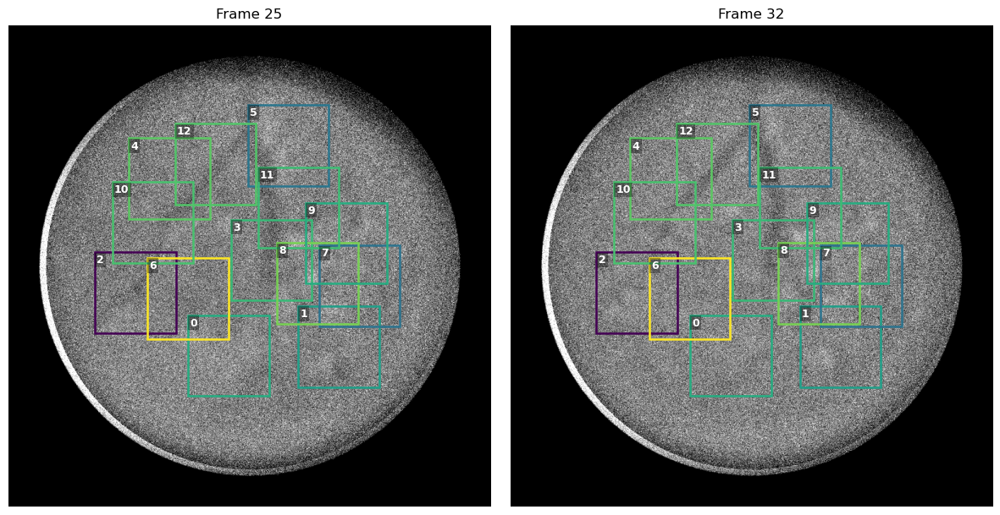

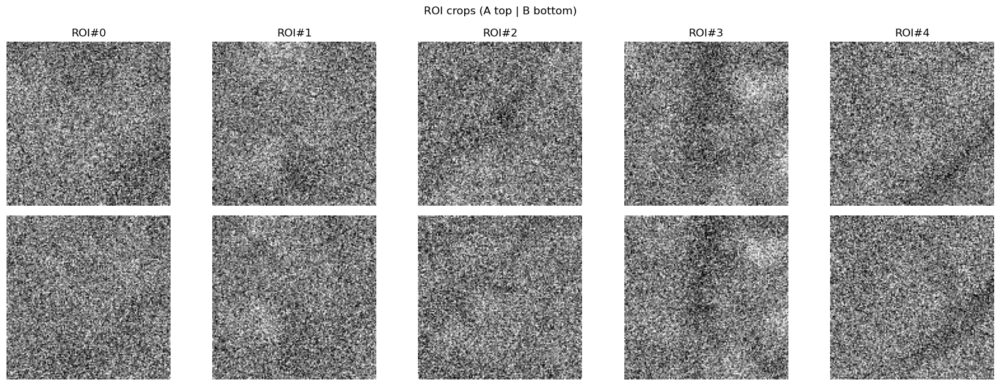

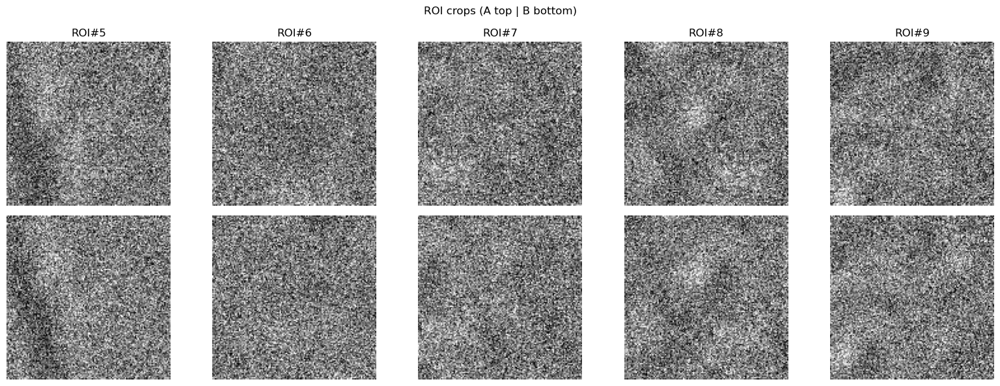

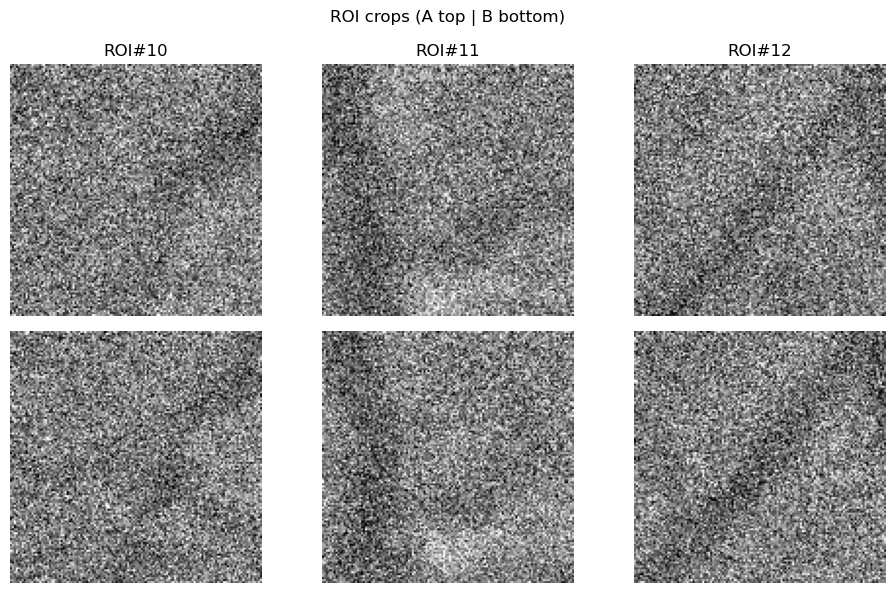

,roi_id,cy,cx,dy,dx,theta_deg,score_trans,score_rot,score
0,0,526.0,350.0,-10.181,6.876,1.583,2118.172119,16637.539062,16637.539062
1,1,512.0,525.0,-10.450,-0.913,-3.750,4765.123047,16637.478516,16637.478516
2,2,426.0,201.0,-8.888,-6.515,-1.650,1484.629028,16636.900391,16636.900391
3,3,374.0,418.0,-12.500,3.228,-1.300,8566.083984,16637.597656,16637.597656
4,4,244.0,255.0,-12.500,2.709,-5.000,3993.677002,16637.673828,16637.673828
5,5,191.0,445.0,-7.700,3.424,1.500,6902.653809,16637.306641,16637.306641
6,6,435.0,285.0,-12.500,7.006,1.875,1835.137939,16637.933594,16637.933594
7,7,415.0,558.0,-10.626,-1.219,1.550,4948.286133,16637.292969,16637.292969
8,8,411.0,491.0,-12.500,-0.102,3.083,6616.954102,16637.722656,16637.722656
9,9,347.0,537.0,-7.330,0.240,1.750,5832.990234,16637.539062,16637.539062


Median dy = -10.464,  dx = 2.709,  theta = -1.220°   (over 13 ROIs)


In [48]:
# === Analysis: frames 25 vs 32 — pick ROIs, estimate translation+rotation, visualize, tabulate ===
import numpy as np
import pandas as pd

# 1) кадры
tA, tB = 25, 32
A = movie[tA].astype("float32")
B = movie[tB].astype("float32")

# 2) выбираем ROI на референсном кадре A
K = 20
hw = 64
search = 12
margin = 12
rim_band = 48
centers, S, valid_core, parts = select_rois_v2(
    A, mask, K=K, hw=hw, search=search, margin=margin,
    w_grad=0.2, w_corner=0.5, w_std=0.3,     # меньше веса градиенту, больше «углам»
    hp_sigma_lo=1.0, hp_sigma_hi=8.0,        # мягкий high-pass
    rim_band=rim_band,                             # дополнительный штраф около края (~50 px)
    min_distance_factor=2.0, oversample=5
)

# 3) считаем для каждого ROI: dy, dx, θ, а также score_trans / score_rot
rows = roi_quality(A, B, centers, hw=hw, search=search)

# 4) визуализация — используем уже объявленные хелперы (с робастной шкалой)
plot_rois_on_frames(A, B, centers, hw=hw, scores=rows[:, -1],
                    titleA=f"Frame {tA}", titleB=f"Frame {tB}", mask=mask)
plot_roi_crops(A, B, centers, hw=hw, cols=5,
               suptitle="ROI crops (A top | B bottom)")

# 5) таблица результатов
cols = ["cy", "cx", "dy", "dx", "theta_deg", "score_trans", "score_rot", "score"]
df = pd.DataFrame(rows, columns=cols)
df.insert(0, "roi_id", np.arange(len(df)))   # удобный индекс ROI
display(df.round({"dy":3, "dx":3, "theta_deg":3, "score_trans":3, "score_rot":3, "score":3}))

# краткая сводка по медианам
print(f"Median dy = {np.median(df['dy']):.3f},  "
      f"dx = {np.median(df['dx']):.3f},  "
      f"theta = {np.median(df['theta_deg']):.3f}°   (over {len(df)} ROIs)")


In [40]:
import numpy as np
import pandas as pd

# centers: список (cy, cx)
# df: таблица с колонками ["roi_id","cy","cx","dy","dx","theta_deg","score_trans","score_rot","score"]

H, W = A.shape
cy_img, cx_img = H/2, W/2

y = df["cy"].to_numpy().astype(float)
x = df["cx"].to_numpy().astype(float)
dx = df["dx"].to_numpy().astype(float)
dy = df["dy"].to_numpy().astype(float)

# Дизайн-матрица для dx и dy (см. формулы выше)
# dx ≈ tx - θ*(y - cy),  dy ≈ ty + θ*(x - cx)
X_dx = np.column_stack([np.ones_like(x), np.zeros_like(x), -(y - cy_img)])
X_dy = np.column_stack([np.zeros_like(x), np.ones_like(x),  +(x - cx_img)])
X = np.vstack([X_dx, X_dy])
y_vec = np.hstack([dx, dy])

# Веса по quality-скору (можно заменить на равные)
w = df["score"].to_numpy().astype(float)
w = w / (w.max() + 1e-9)
W = np.sqrt(np.hstack([w, w]))  # одинаковые веса для dx и dy у одного ROI

# Взвешенное МНК
Xw = X * W[:, None]
yw = y_vec * W
params, *_ = np.linalg.lstsq(Xw, yw, rcond=None)
tx, ty, theta = params  # theta в радианах? -> нет, в тех же единицах, что в формуле (рад)
theta_deg_fit = np.degrees(theta)

# Остатки
res = y_vec - X @ params
res_dx = res[:len(x)]
res_dy = res[len(x):]
rms = np.sqrt(np.mean(res_dx**2 + res_dy**2))

print(f"Global rigid fit:  tx={tx:.3f} px, ty={ty:.3f} px, theta≈{theta_deg_fit:.3f}°")
print(f"RMS residual = {rms:.3f} px (lower is better)")
print(f"Medians: dx={np.median(dx):.3f}, dy={np.median(dy):.3f}, theta_med={np.median(df['theta_deg']):.3f}°")

# Небольшая табличка остатков по ROI (полезно для отсева «плохих»)
df_res = pd.DataFrame({
    "roi_id": df["roi_id"],
    "cx": x, "cy": y,
    "dx": dx, "dy": dy,
    "res_dx": res_dx, "res_dy": res_dy,
    "res_norm": np.hypot(res_dx, res_dy)
}).sort_values("res_norm", ascending=False)
display(df_res.head(10))


Global rigid fit:  tx=1.486 px, ty=-10.586 px, theta≈0.175°
RMS residual = 4.281 px (lower is better)
Medians: dx=1.475, dy=-10.538, theta_med=1.525°


,roi_id,cx,cy,dx,dy,res_dx,res_dy,res_norm
2,2,201.0,426.0,-6.515109,-8.888497,-7.872841,2.255705,8.189618
6,6,285.0,435.0,7.005774,-12.500000,5.675489,-1.611963,5.899966
0,0,350.0,526.0,6.875586,-10.180977,5.822812,0.508837,5.845003
9,9,537.0,347.0,0.239896,-7.329538,-1.358754,2.790002,3.103276
5,5,445.0,191.0,3.423830,-7.699803,1.349443,2.700299,3.018711
8,8,491.0,411.0,-0.102187,-12.500000,-1.505663,-2.240179,2.699152
7,7,558.0,415.0,-1.219169,-10.626104,-2.610447,-0.570606,2.672082
3,3,418.0,374.0,3.227695,-12.500000,1.711384,-2.017559,2.645634
1,1,525.0,512.0,-0.912881,-10.449999,-2.008348,-0.293864,2.029733
4,4,255.0,244.0,2.709224,-12.500000,0.796466,-1.520475,1.716451


In [44]:
import numpy as np
import pandas as pd

# centers: список (cy, cx)
# df: таблица с колонками ["roi_id","cy","cx","dy","dx","theta_deg","score_trans","score_rot","score"]

H, W = A.shape
cy_img, cx_img = H/2, W/2

y = df["cy"].to_numpy().astype(float)
x = df["cx"].to_numpy().astype(float)
dx = df["dx"].to_numpy().astype(float)
dy = df["dy"].to_numpy().astype(float)

# Дизайн-матрица для dx и dy (см. формулы выше)
# dx ≈ tx - θ*(y - cy),  dy ≈ ty + θ*(x - cx)
X_dx = np.column_stack([np.ones_like(x), np.zeros_like(x), -(y - cy_img)])
X_dy = np.column_stack([np.zeros_like(x), np.ones_like(x),  +(x - cx_img)])
X = np.vstack([X_dx, X_dy])
y_vec = np.hstack([dx, dy])

# Веса по quality-скору (можно заменить на равные)
w = df["score"].to_numpy().astype(float)
w = w / (w.max() + 1e-9)
W = np.sqrt(np.hstack([w, w]))  # одинаковые веса для dx и dy у одного ROI

# Взвешенное МНК
Xw = X * W[:, None]
yw = y_vec * W
params, *_ = np.linalg.lstsq(Xw, yw, rcond=None)
tx, ty, theta = params  # theta в радианах? -> нет, в тех же единицах, что в формуле (рад)
theta_deg_fit = np.degrees(theta)

# Остатки
res = y_vec - X @ params
res_dx = res[:len(x)]
res_dy = res[len(x):]
rms = np.sqrt(np.mean(res_dx**2 + res_dy**2))

print(f"Global rigid fit:  tx={tx:.3f} px, ty={ty:.3f} px, theta≈{theta_deg_fit:.3f}°")
print(f"RMS residual = {rms:.3f} px (lower is better)")
print(f"Medians: dx={np.median(dx):.3f}, dy={np.median(dy):.3f}, theta_med={np.median(df['theta_deg']):.3f}°")

# Небольшая табличка остатков по ROI (полезно для отсева «плохих»)
df_res = pd.DataFrame({
    "roi_id": df["roi_id"],
    "cx": x, "cy": y,
    "dx": dx, "dy": dy,
    "res_dx": res_dx, "res_dy": res_dy,
    "res_norm": np.hypot(res_dx, res_dy)
}).sort_values("res_norm", ascending=False)
display(df_res.head(10))


Global rigid fit:  tx=1.029 px, ty=-10.955 px, theta≈-0.085°
RMS residual = 4.736 px (lower is better)
Medians: dx=2.709, dy=-10.450, theta_med=-1.650°


,roi_id,cx,cy,dx,dy,res_dx,res_dy,res_norm
2,2,201.0,426.0,-6.515109,-8.888497,-7.606374,1.793808,7.815029
0,0,350.0,526.0,6.875586,-10.180977,5.635391,0.723234,5.681611
3,3,418.0,374.0,3.227695,-12.500000,2.213874,-1.494517,2.671108
4,4,255.0,244.0,2.709224,-12.500000,1.889011,-1.737272,2.566413
1,1,525.0,512.0,-0.912881,-10.449999,-2.132225,0.714839,2.248861
